In [2]:
%load_ext autoreload
%autoreload 2
import sys
print(sys.executable)
import sklearn.preprocessing as pre, scipy, numpy as np, matplotlib.pyplot as plt, glob, pickle, pyemma as py, sys, os
import pandas as pd
import seaborn as sns 
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]= "2"
%matplotlib inline
from temp_tf_load import *
sys.path.append('../')
from hde import HDE, analysis
lag_time = 10
import warnings
warnings.filterwarnings('ignore')

print(tf.__version__)
print(py.__version__)



/home/mikejones/anaconda3/bin/python


Using TensorFlow backend.




1.14.0
2.5.6


In [3]:
# load thermo and pairwise distance features seperately
# only pwd features are used to train the model, thermo are for plotting

trim_length = 1000   #uses this many trajs from full list
chunk_size = 400    #takes this large of a bite from the middle of alreadhy chunked data


#thermo_features = np.load('/home/mikejones/scratch-midway2/srv/dna_data/thermo-2831-1000-10.npy')
pwd_features_trimmed = np.load('/home/mikejones/scratch-midway2/srv/dna_data/pwdr-2831-1000-190.npy')[:trim_length]
pwd_features = [item[int((trim_length - chunk_size) / 2) : int((trim_length + chunk_size) / 2), :] for item in pwd_features_trimmed]
#pwd_features = np.load('/home/mikejones/scratch-midway2/srv/dna_data/pwdr-all_t-1000-5000-190.npy')[:300]

scaler = pre.MinMaxScaler(feature_range=(-1, 1))

#scaler.fit(np.concatenate(thermo_features))
#thermo_features_s = [scaler.transform(item) for item in thermo_features]

scaler.fit(np.concatenate(pwd_features))
pwd_features_s = [scaler.transform(item) for item in pwd_features]

print(np.shape(pwd_features))


(1000, 400, 190)


## kernel tICA

In [4]:
from temp_ktica import *

In [5]:
# find landmarks, this may take a while.  We use 5000 landmarks in our paper, but it 
# takes very long time to do clustering, so here we use 2000 instead
# try using 1000 instead 

from sklearn.cluster import KMeans
n_landmarks = 400
kmeans = KMeans(init='k-means++', n_clusters=n_landmarks, n_init=10)
kmeans.fit(np.concatenate(pwd_features_s)[::50])


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=400, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [6]:

# take longer than previous cell
temp_dataset = np.concatenate(pwd_features_s)
temp_landmarks = kmeans.cluster_centers_
for sigma in [2.0]:    #  # best sigma for scaled pairwise distances with 5000 landmarks
    ktica = Kernel_tica(3, lag_time=10, gamma=1./(2 * sigma ** 2), n_components_nystroem=len(temp_landmarks), 
                       landmarks = temp_landmarks)
    ktica_coords = ktica.fit_transform([temp_dataset])[0]
    print(sigma, ktica._tica.timescales[:5])
    ktica_timescales = ktica._tica.timescales[:3]



using landmarks


2.0 [118.76307989  88.88660972  79.68414116  76.95623758  76.63129135]


In [7]:


print (np.shape(ktica_coords))
print (ktica_timescales)

#np.save('/home/mikejones/scratch-midway2/srv/ktica_coords/unchunk_300-t_1000-c_500-s.npy', ktica_coords)



(400000, 3)
[118.76307989  88.88660972  79.68414116]


In [8]:
# these are precomputed ktica coordinates and timescales
#ktica_coords = np.load('/home/mikejones/scratch-midway2/srv/ktica_coords/chunk_500-t_1000-c_50-s.npy')
# ktica_coords = np.load('/home/mikejones/scratch-midway2/srv/ktica_coords/unchunk_100-t_1000-c_50-s.npy')
# ktica_timescales = np.load('/home/kengyangyao/data/hde_paper_results/adp_ktica_timescales.npy')

## HDE

In [9]:
skip = 1
from keras.callbacks import EarlyStopping
earlyStopping = EarlyStopping(monitor='val_loss', patience=30, verbose=1, mode='min', restore_best_weights=True)

n_sm = 6 

hde = HDE(190, n_components=n_sm, lag_time=lag_time // skip, dropout_rate=0, batch_size=500000, n_epochs=10, 
          validation_split=0.2, batch_normalization=True, learning_rate = 0.01,
          callbacks=[earlyStopping])


In [10]:
# hde.r_degree = 10    # pre-training, to speed up discovery of first few slowest modes
# hde.batch_size = 200000
# hde.n_epochs = 50
# hde.fit(pairwise_dis_s)
# hde._recompile = True
# hde.r_degree = 5
# hde.fit(pairwise_dis_s)
# hde.batch_size = 500000
# hde._recompile = True
# hde.r_degree = 2
# hde.n_epochs = 100
# hde.fit(pairwise_dis_s)

In [11]:
hde.r_degree = 2
hde.n_epochs = 100
hde.fit(np.concatenate(pwd_features_s))


Instructions for updating:
Use `tf.cast` instead.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 319992 samples, validate on 79998 samples
Epoch 1/100
319992/319992 [==============================] - 5s 16us/step - loss: -3.1004 - val_loss: -4.3503
Epoch 2/100
319992/319992 [==============================] - 3s 10us/step - loss: -4.4863 - val_loss: -5.0419
Epoch 3/100
319992/319992 [==============================] - 3s 10us/step - loss: -5.0650 - val_loss: -5.2851
Epoch 4/100
319992/319992 [==============================] - 3s 10us/step - loss: -5.2952 - val_loss: -5.4123
Epoch 5/100
319992/319992 [==============================] - 3s 10us/step - loss: -5.4320 - val_loss: -5.4981
Epoch 6/100
319992/319992 [==============================] - 3s 10us/step - loss: -5.5151 - val_loss: -5.5544
Epoch 7/100
319992/319992 [==============================] - 3s 11us/step - loss: -5.5656 - val_loss: -5.5933
Epoch 8/100
319992/319992 [=======

Epoch 68/100
319992/319992 [==============================] - 3s 10us/step - loss: -6.0796 - val_loss: -6.0659
Epoch 69/100
319992/319992 [==============================] - 3s 10us/step - loss: -6.0820 - val_loss: -6.0676
Epoch 70/100
319992/319992 [==============================] - 3s 10us/step - loss: -6.0841 - val_loss: -6.0696
Epoch 71/100
319992/319992 [==============================] - 3s 10us/step - loss: -6.0864 - val_loss: -6.0716
Epoch 72/100
319992/319992 [==============================] - 3s 10us/step - loss: -6.0885 - val_loss: -6.0735
Epoch 73/100
319992/319992 [==============================] - 3s 10us/step - loss: -6.0907 - val_loss: -6.0752
Epoch 74/100
319992/319992 [==============================] - 3s 11us/step - loss: -6.0928 - val_loss: -6.0770
Epoch 75/100
319992/319992 [==============================] - 3s 10us/step - loss: -6.0948 - val_loss: -6.0788
Epoch 76/100
319992/319992 [==============================] - 3s 10us/step - loss: -6.0968 - val_loss: -6.0806
E

HDE(activation=None, batch_normalization=True, batch_size=500000,
    callbacks=[<keras.callbacks.EarlyStopping object at 0x7f183c0609b0>],
    dropout_rate=0, hidden_layer_depth=None, hidden_size=None, input_size=190,
    l2_regularization=0.0, lag_time=10, latent_space_noise=0,
    learning_rate=0.01, n_components=6, n_epochs=100, validation_split=0.2,
    verbose=True)

In [12]:

hde_coords = [hde.transform(item) for item in pwd_features_s]
#np.save('/home/mikejones/scratch-midway2/srv/hde_coords/unchunk_300-t_190-f', ktica_coords)
hde_timescales = hde.timescales_
print(hde_timescales)


[201.70571797 155.61840174 139.99161006 116.88287082 115.81590834
  89.03722026]


In [13]:
## make pandas data frame
## add ktica coords to df

skip = 1000    #num coords to skip on plot
num_bp = 10

print (np.shape(hde_coords))
print (np.shape(pwd_features_s))

hde_coords_conc = np.concatenate(hde_coords)[::skip]
pwd_features_conc = np.concatenate(pwd_features_s)[::skip]

index_size = len(hde_coords_conc[:, 0])

print (np.shape(hde_coords_conc))
print (np.shape(pwd_features_conc))


hde_col_list = ['1st_EF', '2nd_EF', '3rd_EF', '4th_EF', '5th_EF', '6th_EF', '7th_EF']
df = pd.DataFrame(data    = hde_coords_conc, 
                  columns = hde_col_list[:n_sm],
                  index   = np.linspace(1, index_size, index_size))

#dict shows which indices need to be averaged in order to form their corresponding features
bp_match_dict  =  {'inter_ends':[9, 90],
                   'inter_cores':[45, 54],
                   'inter_all':[i*9 for i in range (num_bp)],
                   'intra_ends':[136, 181],
                   'intra_end_to_core':[110, 140, 155, 185],
                   'shift_2_up':[i*10 + (i + 2) for i in range(8)],
                   'shift_2_down':[(i + 2)*10 + i for i in range(8)],
                   'shift_4_up':[i*10 + (i + 4) for i in range(6)],
                   'shift_4_down':[(i + 4)*10 + i for i in range(6)],
                   'shift_6_up':[i*10 + (i + 6) for i in range(4)],
                   'shift_6_down':[(i + 6)*10 + i for i in range(4)],
                   'shift_8_up':[i*10 + (i + 8) for i in range(2)],
                   'shift_8_down':[(i + 8)*10 + i for i in range(2)]
                   }


#adds each mean calculation to the dataframe where the dict key becomes the col name
for key in bp_match_dict:
    mean_vec = np.mean(pwd_features_conc[:, bp_match_dict[key]], axis=1)
    df[key] = mean_vec

    
ktica_list = ['1st_KT', '2nd_KT', '3rd_KT']

for i in range(len(ktica_list)):
    df[ktica_list[i]] = ktica_coords[::skip, i]
    
'''

df_thermo =  pd.DataFrame(data    = thermo_features_conc, 
                   columns = feature_col_list, 
                   index   = np.linspace(1, index_size, index_size))

df = df_hde.join(df_thermo)
df = df.join(df_bp)

'''

print(df.head())

(1000, 400, 6)
(1000, 400, 190)
(400, 6)
(400, 190)
       1st_EF    2nd_EF    3rd_EF    4th_EF    5th_EF    6th_EF  inter_ends  \
1.0  1.749181  0.694067 -0.412154  1.199631  0.355779  0.525351   -0.344361   
2.0 -0.810298 -0.085306  0.116029  0.266200  0.000707 -0.445437   -0.503366   
3.0  0.534711 -0.281628 -0.545844  0.026327 -1.501555  0.961006    0.467136   
4.0 -1.796885  0.280605 -0.312753  1.083109  2.586578  3.818734   -0.492711   
5.0 -1.604535  0.334419 -0.760906  0.909550 -0.296284 -1.479323    0.082166   

     inter_cores  inter_all  intra_ends  ...  shift_2_down  shift_4_up  \
1.0     0.307213   0.023814   -0.820845  ...     -0.576085   -0.064602   
2.0    -0.312485  -0.179143   -0.863680  ...     -0.304763   -0.524805   
3.0     0.471621   0.410452   -0.790146  ...     -0.287524   -0.093168   
4.0    -0.628897  -0.366263   -0.828146  ...     -0.510232   -0.793516   
5.0     0.820634   0.098483   -0.869477  ...     -0.330119   -0.596886   

     shift_4_down  shift_6_u

In [14]:
import matplotlib.pylab as plt
import matplotlib.gridspec as gridspec

def plot_subs(df, bp_match_dict, EF):
    
    plt.rcParams.update({'font.size': 22})
    dim = len(bp_match_dict)
    
    tPlot, axes = plt.subplots(
            nrows=dim, ncols=dim, sharex=True, sharey=False, figsize=[20, 20],
            gridspec_kw={'wspace':0.2, 'hspace': 0.2}
            )

    axes_labels = [0 for i in range(dim**2)]

    for j, k_i in enumerate(bp_match_dict):
        for i, k_j in enumerate(bp_match_dict):
            
            x = df[k_i]
            y = df[k_j]
            axes_labels[i*dim+j] = [k_i, k_j]
            color = df[EF]
            
            axes[i][j].scatter(x, y, c=color, cmap='magma')


    for i, ax in enumerate(axes.flat):
        ax.set(xlabel=axes_labels[i][0], ylabel=axes_labels[i][1])
        ax.label_outer()
            
    plt.show()
    
    
def plot_ktica(df, ktica_list, pwd_coord):
    
    plt.rcParams.update({'font.size': 22})
    dim = len(ktica_list)
    
    tPlot, axes = plt.subplots(
            nrows=dim, ncols=dim, sharex=True, sharey=False, figsize=[20, 20],
            gridspec_kw={'wspace':0.2, 'hspace': 0.2}
            )

    axes_labels = [0 for i in range(dim**2)]

    for j, k_i in enumerate(ktica_list):
        for i, k_j in enumerate(ktica_list):
            
            x = df[k_i]
            y = df[k_j]
            axes_labels[i*dim+j] = [k_i, k_j]
            color = df[pwd_coord]
            
            axes[i][j].scatter(x, y, c=color, cmap='magma')


    for i, ax in enumerate(axes.flat):
        ax.set(xlabel=axes_labels[i][0], ylabel=axes_labels[i][1])
        ax.label_outer()
            
    plt.show()
    

(10, 400, 190)
(10, 400, 3)
(10, 400, 6)


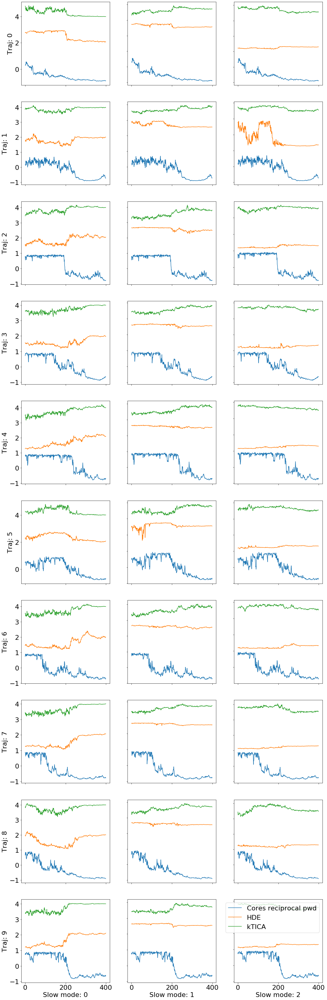

In [15]:
## grab specific indexed trajectories (with corresponding vmd snapshots) and plot with trained srv

## index of snapshot data
## need to make into subplots

#snapshot_list = [2, 5, 6]

snapshot_list = [i for i in range(10)]

scaler = pre.MinMaxScaler(feature_range=(-1, 1))
traj_num = len(pwd_features_s[0][:, 0])

pwd_snap = [pwd_features_s[i] for i in snapshot_list]

scaler.fit(np.concatenate(hde_coords))
hde_snap = [scaler.transform(hde_coords[i]) for i in snapshot_list]

scaler.fit(ktica_coords)
ktica_snap = [scaler.transform(ktica_coords[(traj_num*i):(traj_num*(i+1)), :]) for i in snapshot_list]

print (np.shape(pwd_snap))
print (np.shape(ktica_snap))
print (np.shape(hde_snap))

dim_x = len(ktica_snap[0][0, :])
dim_y = len(snapshot_list)
axes_labels = [0 for i in range(dim_x * dim_y)]

plt.rcParams.update({'font.size': 22})
tPlot, axes = plt.subplots(
        nrows=dim_y, ncols=dim_x, sharex=True, sharey=False, figsize=[6*dim_x, 6*dim_y],
        gridspec_kw={'wspace':0.2, 'hspace': 0.2}
        )

for i in range(dim_y):
    
    i_snap = snapshot_list[i]
    
    for j in range (0, dim_x):
        
        axes[i][j].plot((pwd_snap[i_snap][:, 45] + pwd_snap[i][:, 54]) / 2, label='Cores reciprocal pwd')
        axes[i][j].plot(hde_snap[i_snap][:, j] + 2, label='HDE')
        axes[i][j].plot(ktica_snap[i_snap][:, j] + 4, label='kTICA')
        axes_labels[i*dim_x+j] = ['Slow mode: ' + str(j), 'Traj: ' + str(i_snap)]
        
for i, ax in enumerate(axes.flat):
        ax.set(xlabel=axes_labels[i][0], ylabel=axes_labels[i][1])
        ax.label_outer()
        
ax.legend()
        
plt.show()


color =  inter_ends


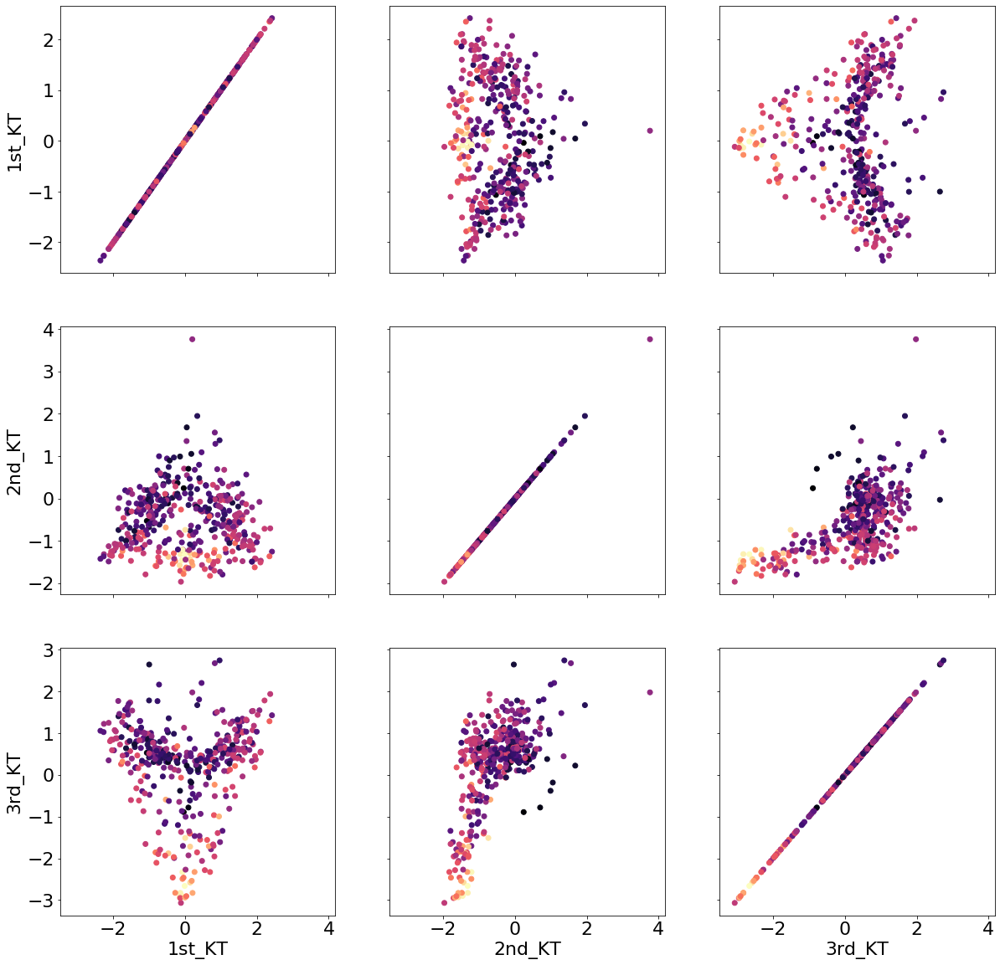

color =  inter_cores


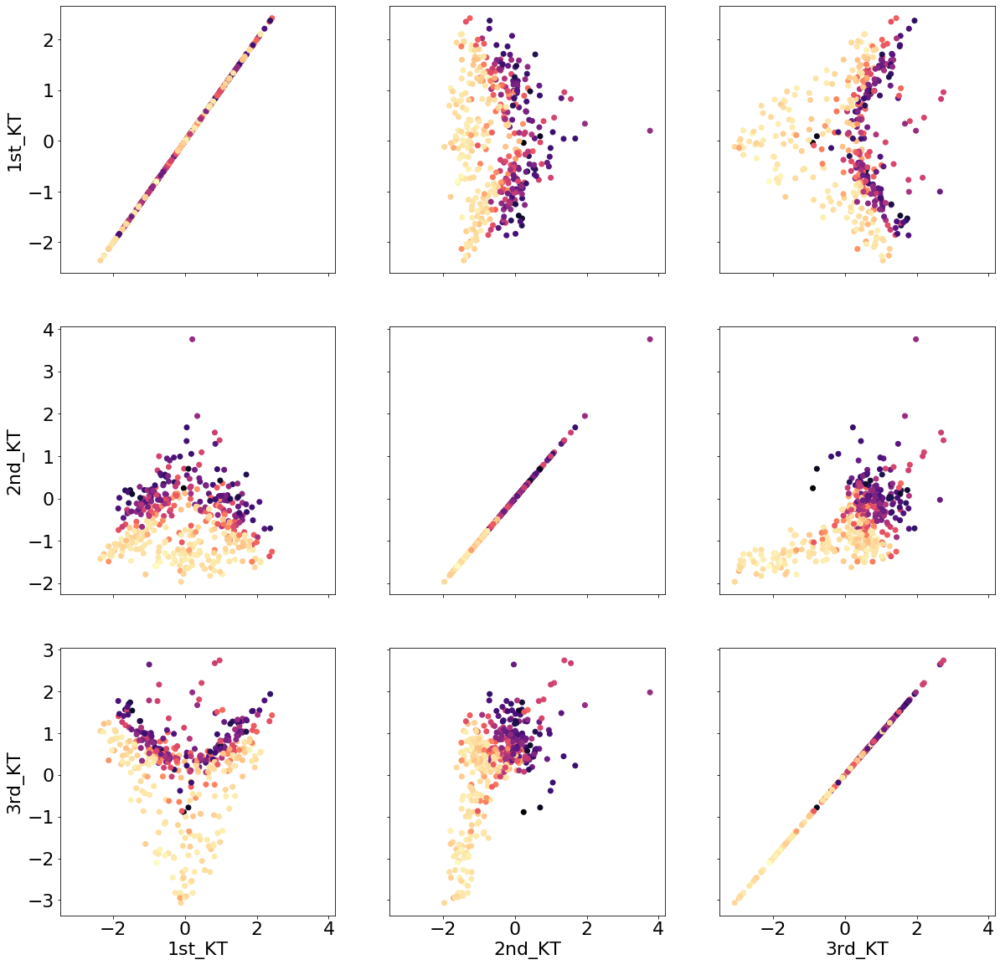

color =  inter_all


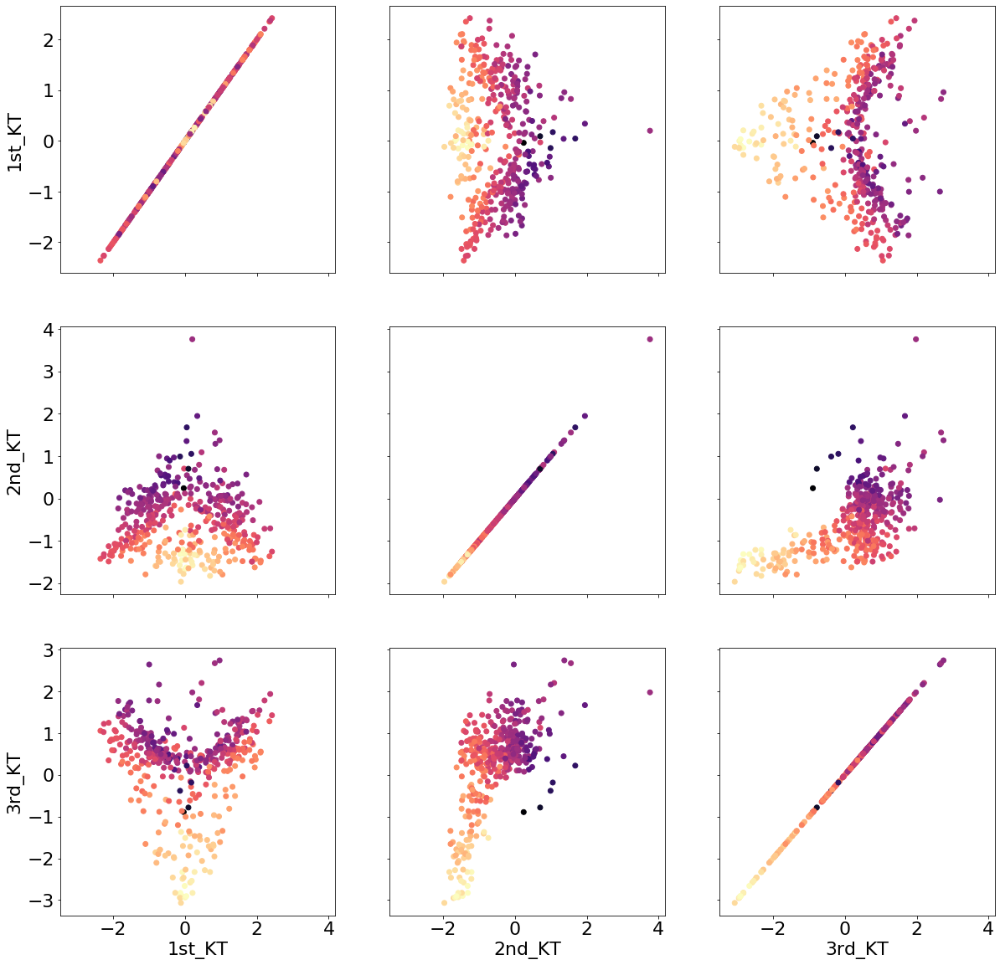

color =  intra_ends


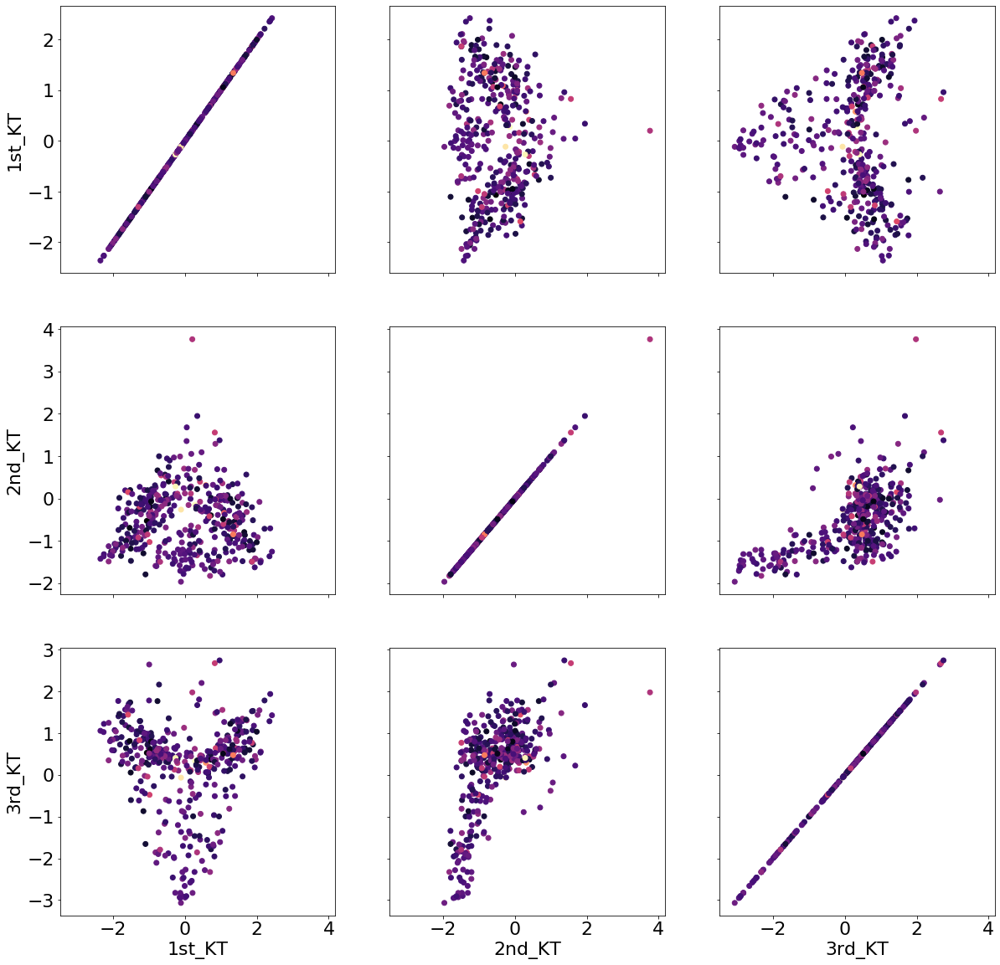

color =  intra_end_to_core


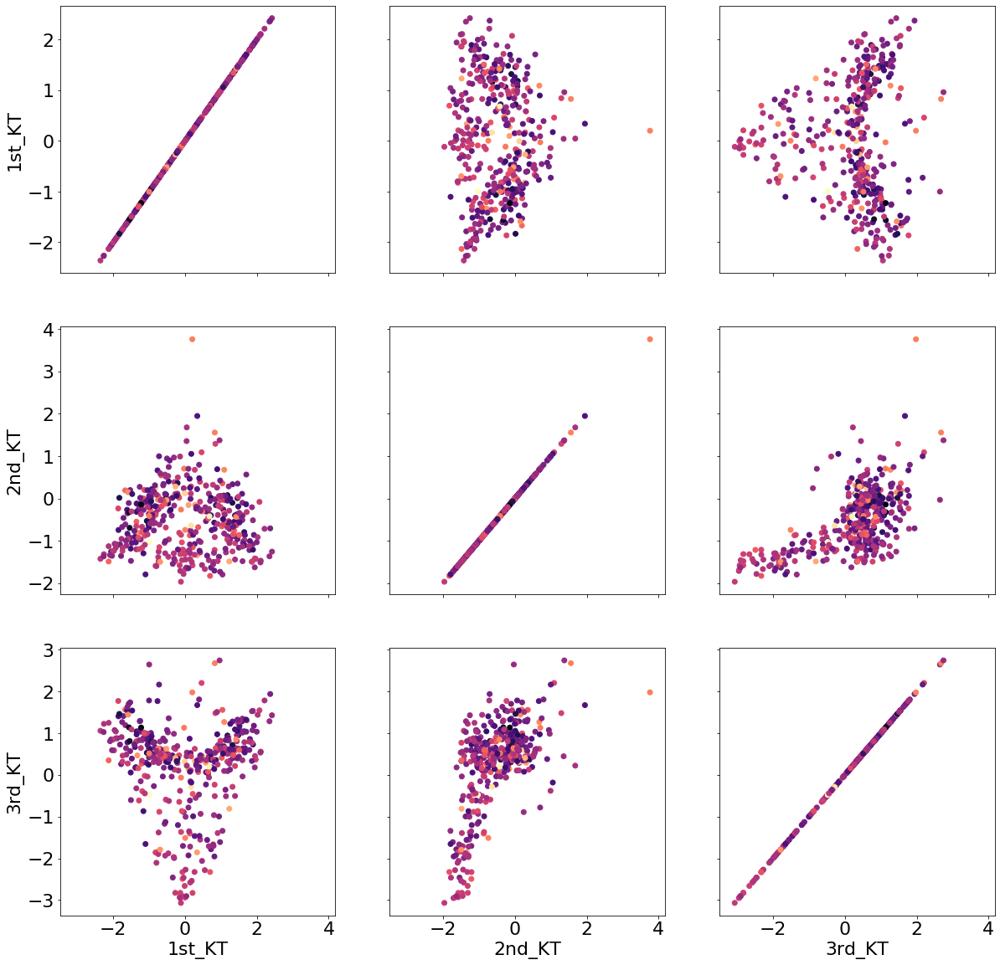

color =  shift_2_up


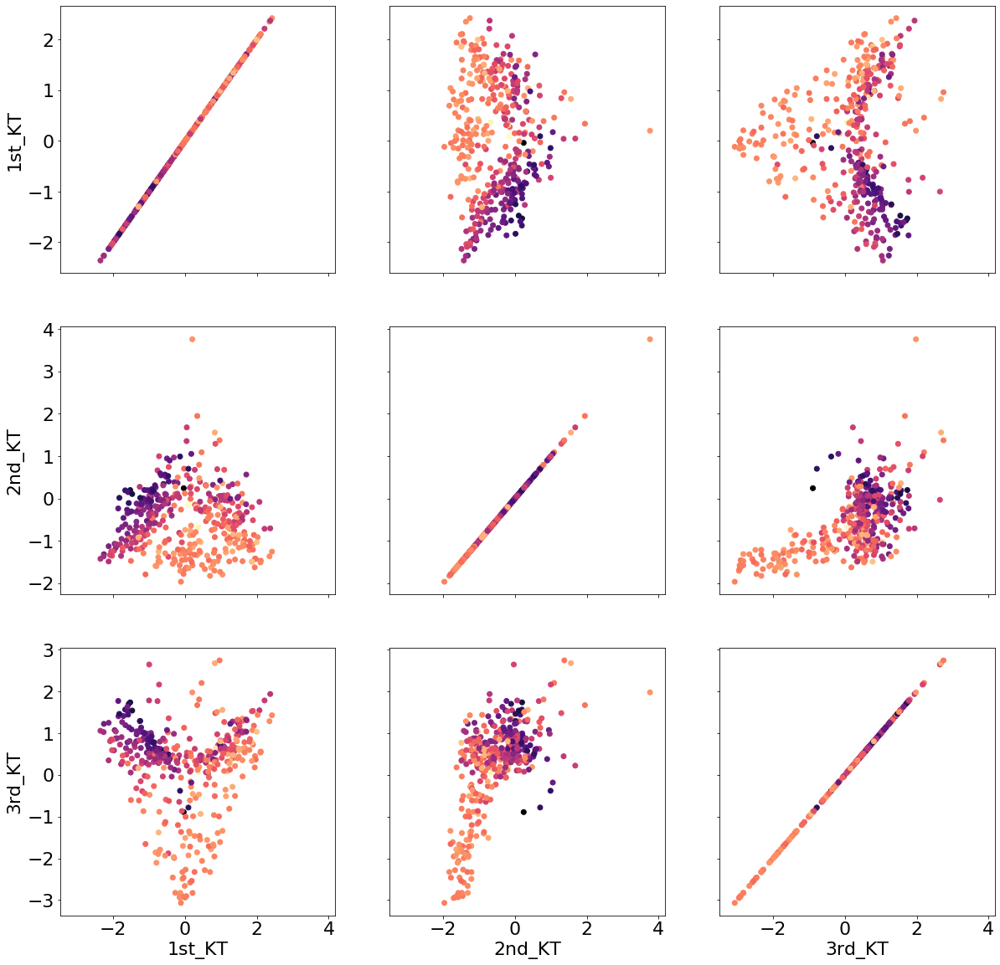

color =  shift_2_down


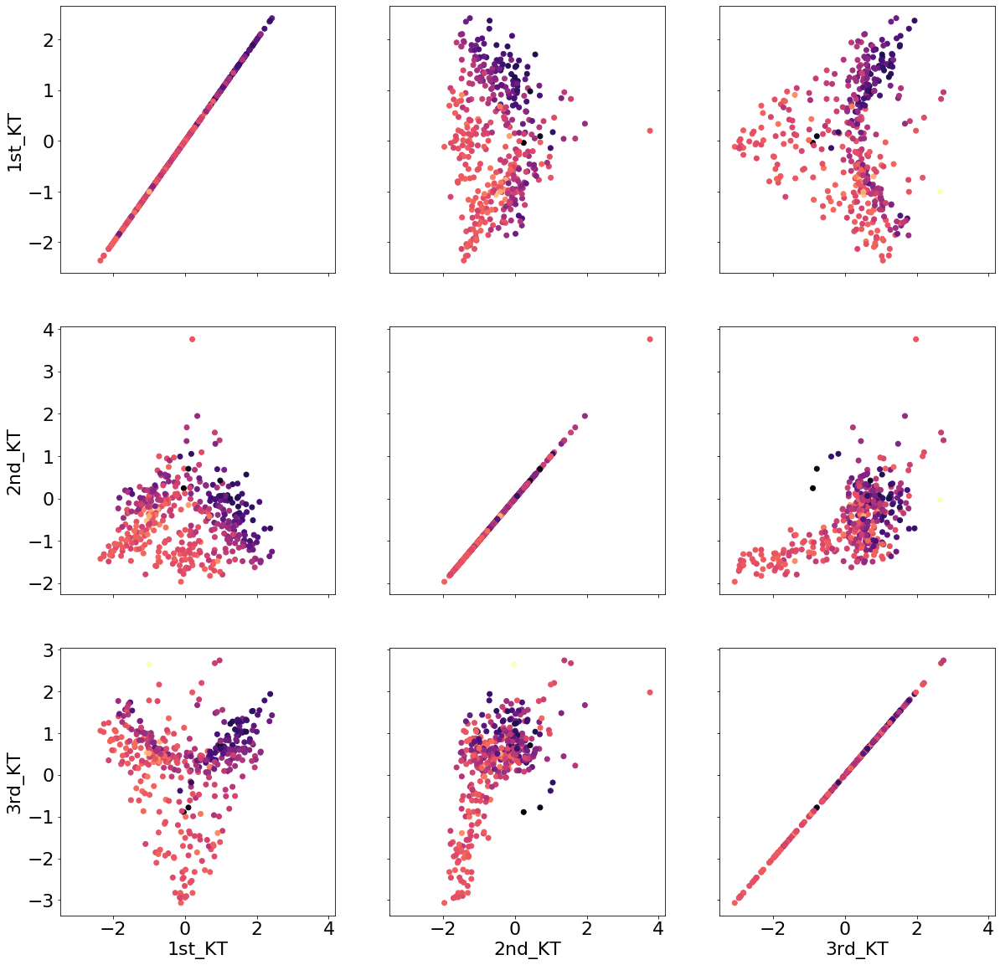

color =  shift_4_up


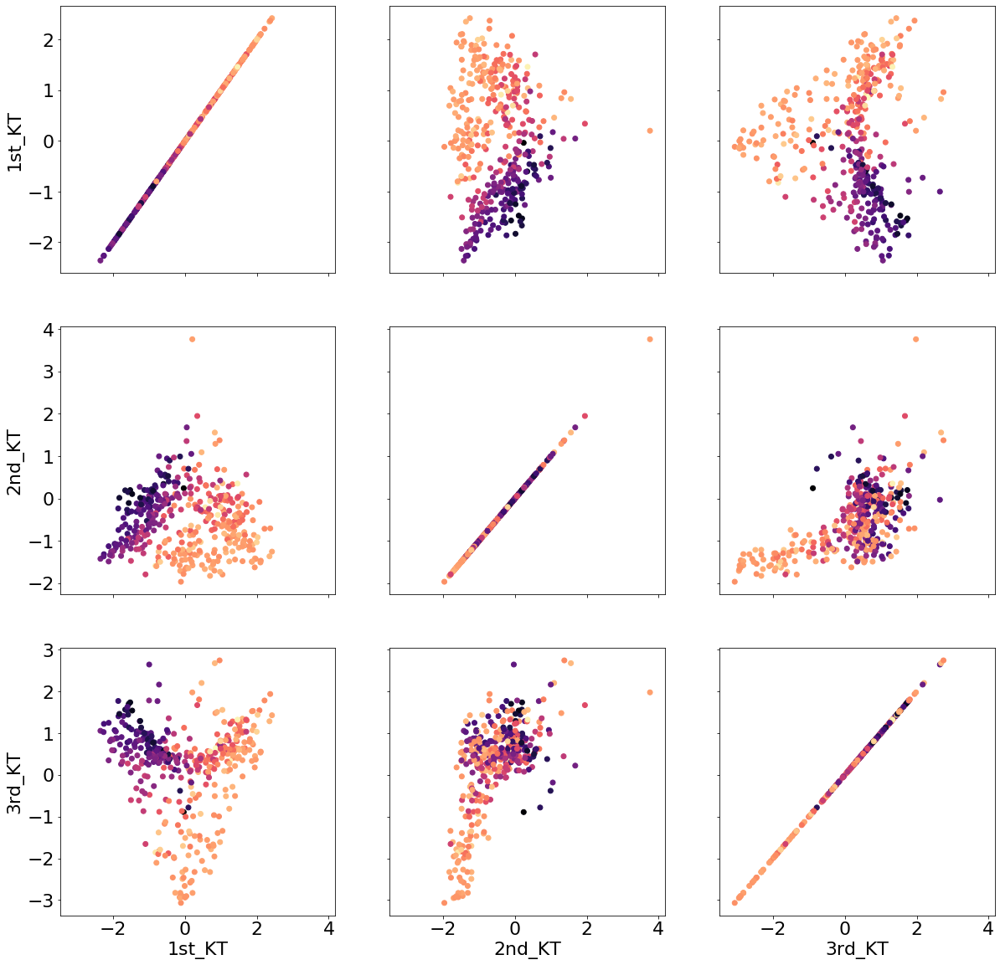

color =  shift_4_down


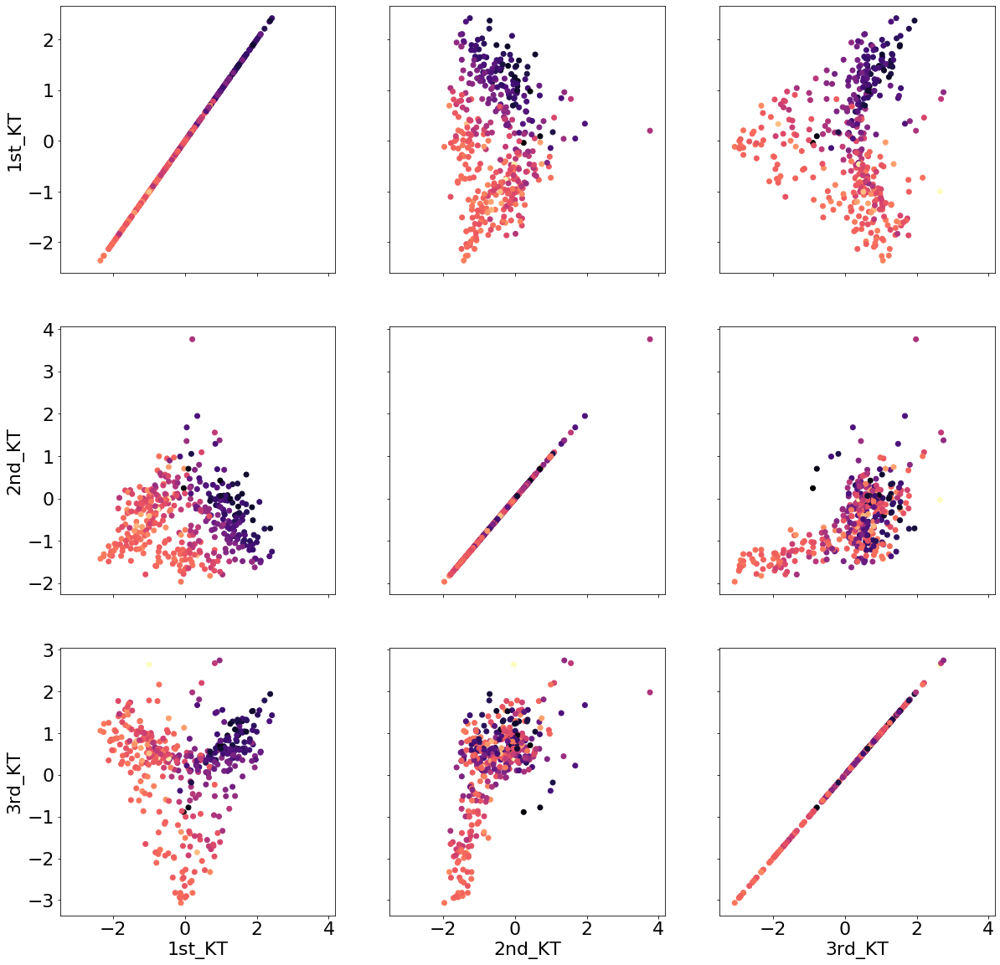

color =  shift_6_up


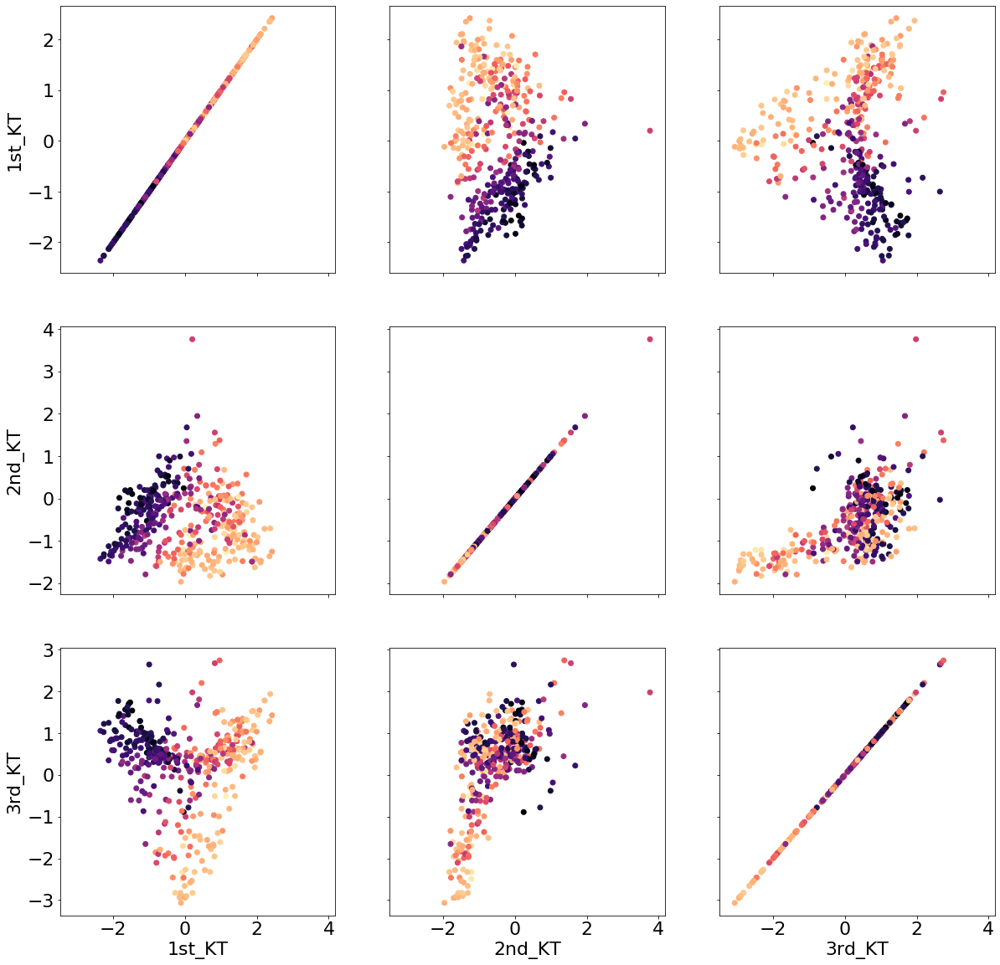

color =  shift_6_down


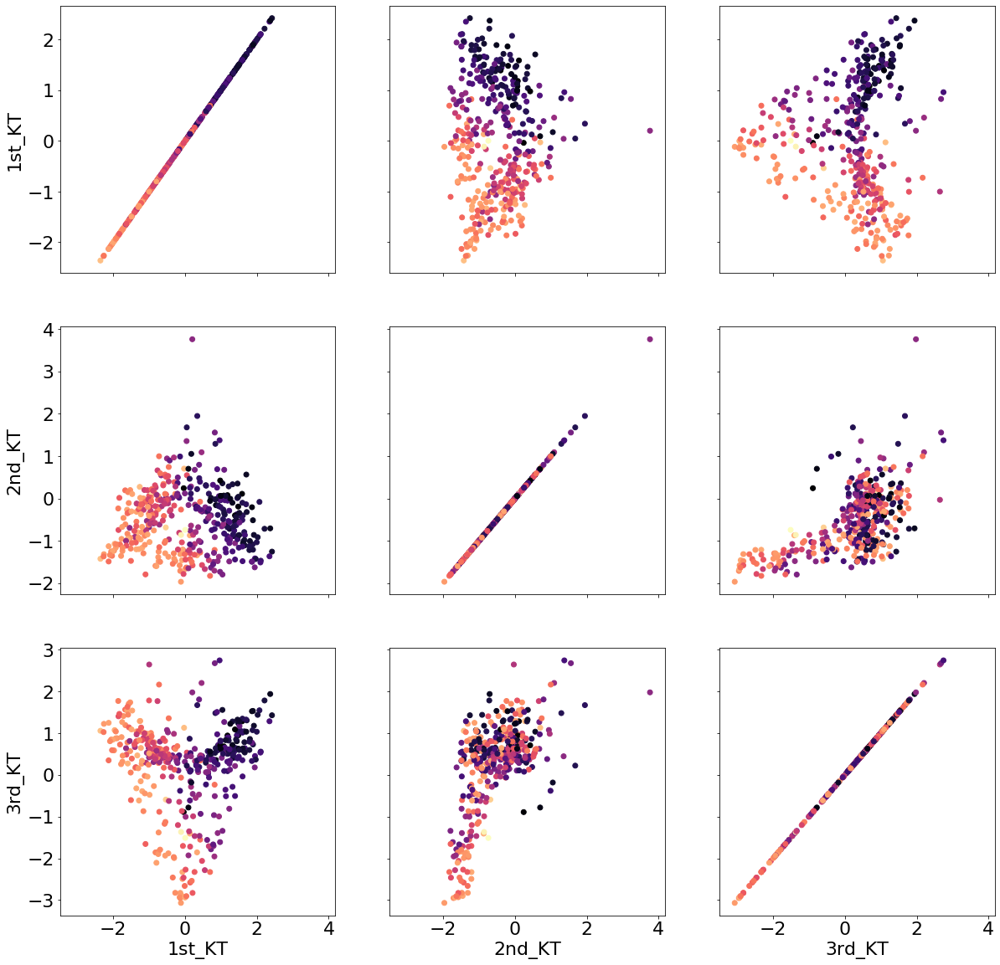

color =  shift_8_up


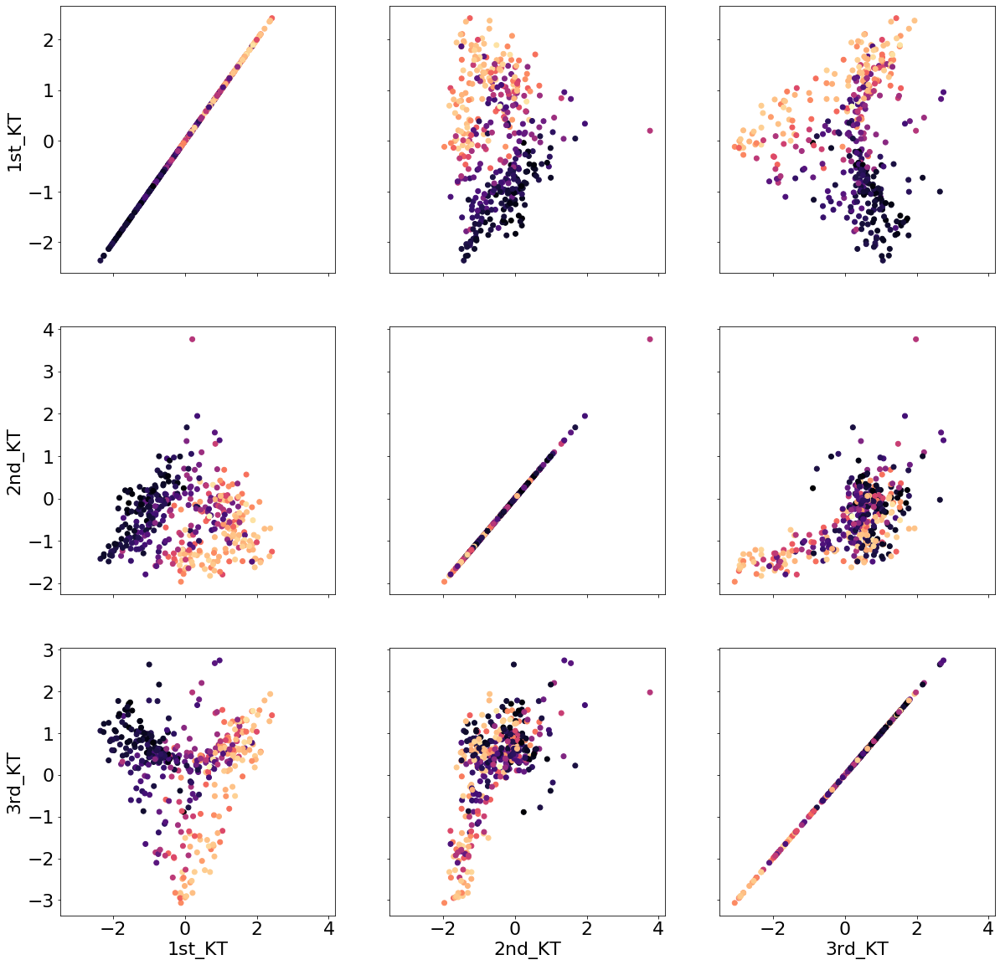

color =  shift_8_down


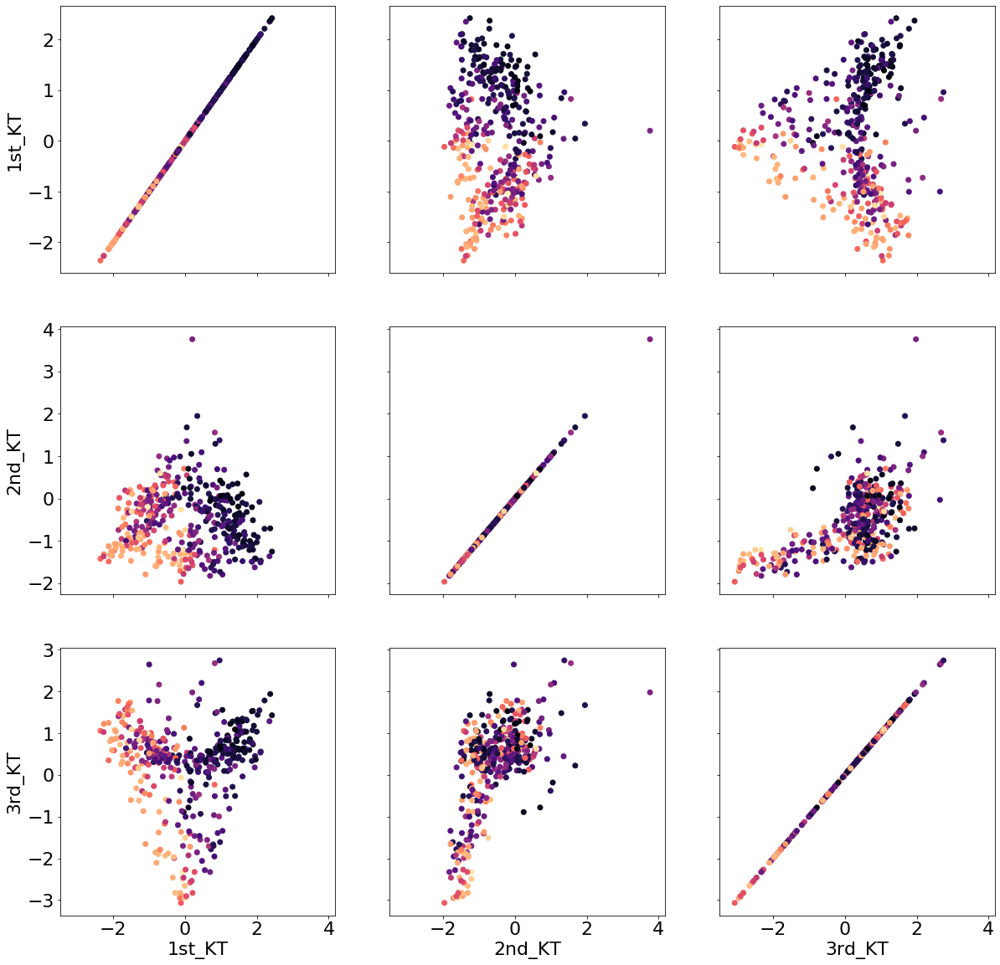

In [16]:
## maps all ktica coords against each other with physical features as the color map

for key in bp_match_dict:
    
    print('color = ', key)
    plot_ktica(df, ktica_list, key)

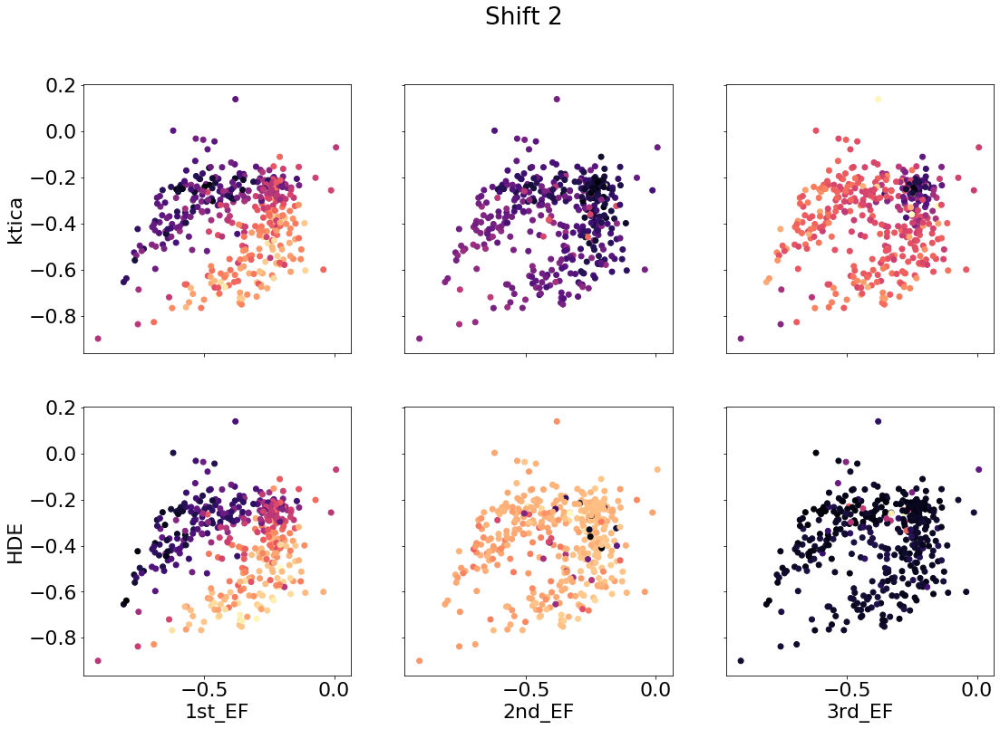

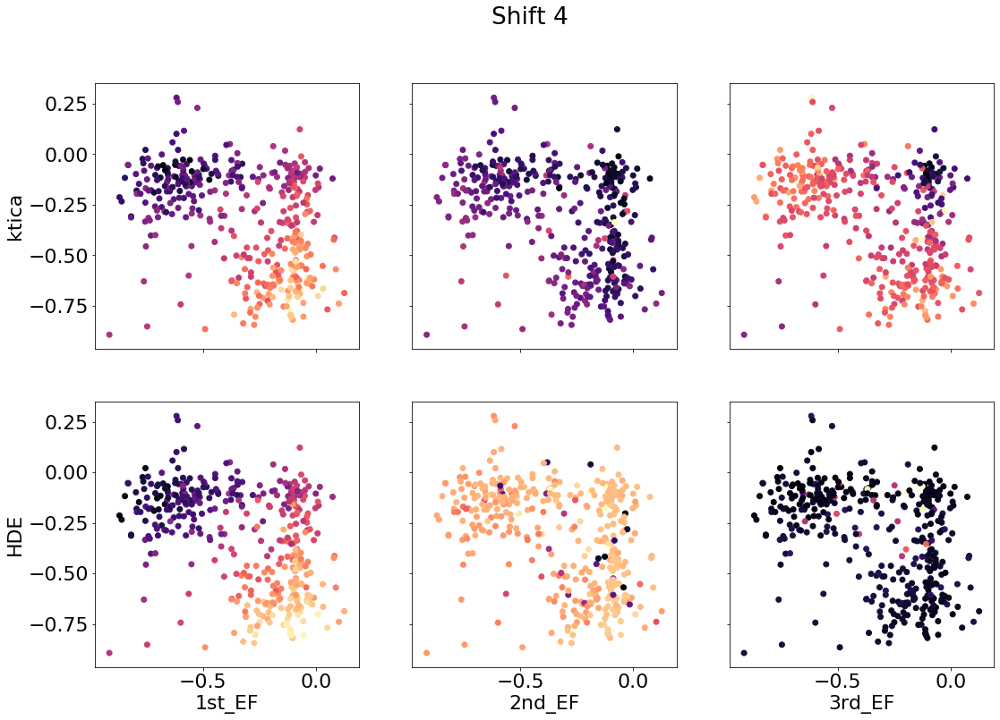

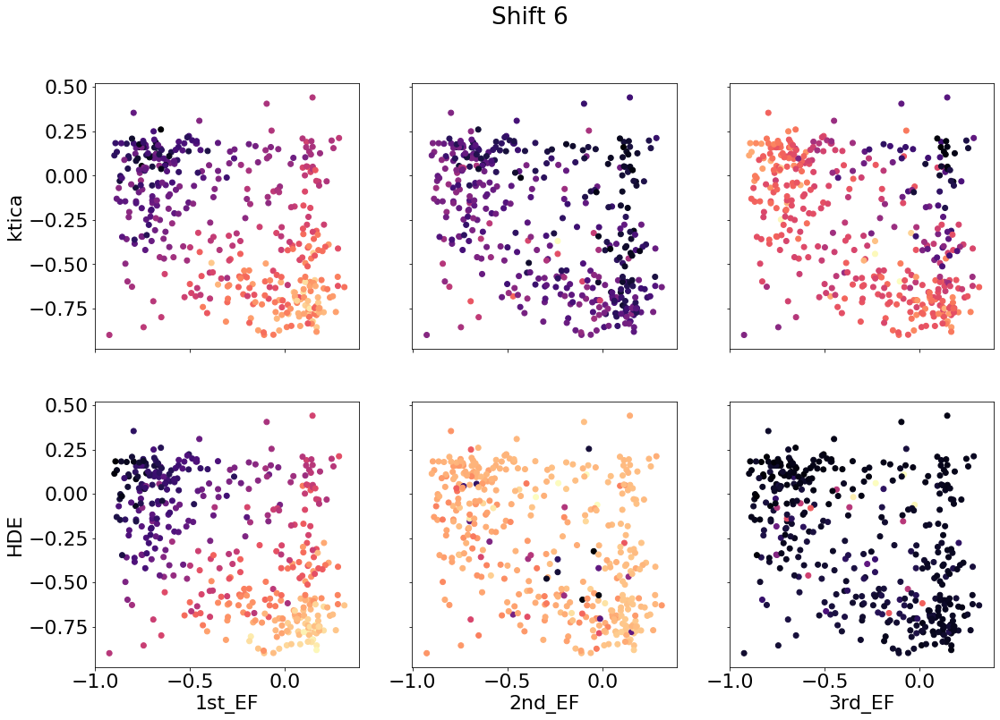

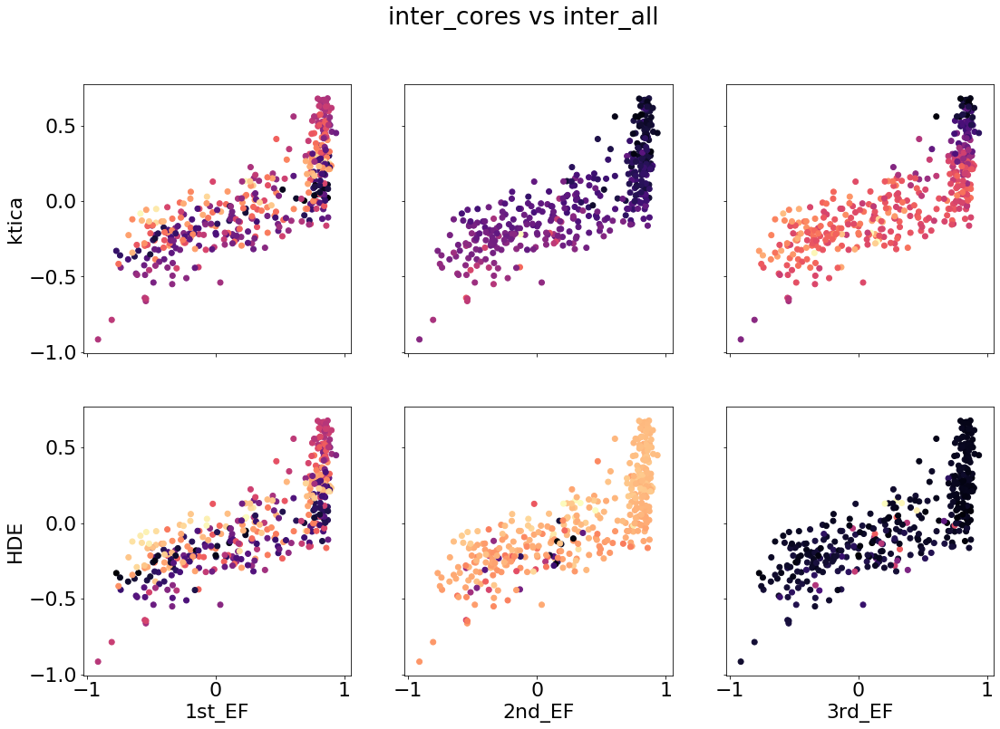

In [26]:
## print inter_all vs inter_core for first three ktica coords and HDE coords


def plot_shift(x, y, name):
    
    plt.rcParams.update({'font.size': 22})

    dim_x = 3
    dim_y = 2


    tPlot, axes = plt.subplots(
            nrows=dim_y, ncols=dim_x, sharex=True, sharey=False, figsize=[6*dim_x, 6*dim_y],
            gridspec_kw={'wspace':0.2, 'hspace': 0.2}
            )
    tPlot.suptitle(name)
    axes_labels = [0 for i in range(dim_x * dim_y)]

    for i in range(dim_x):

        color_index = ktica_list[i]
        color = df[color_index]
        axes_labels[i] = ['ktica', color_index]

        axes[0][i].scatter(x, y, c=color, cmap='magma')

    for i in range(dim_x):

        color_index = hde_col_list[i]
        color = df[color_index]
        axes_labels[i + 3] = ['HDE', color_index]

        axes[1][i].scatter(x, y, c=color, cmap='magma')


    for i, ax in enumerate(axes.flat):
        ax.set(xlabel=axes_labels[i][1], ylabel=axes_labels[i][0])
        ax.label_outer()

    plt.show()
    
plot_shift(df['shift_2_up'], df['shift_2_down'], 'Shift 2')
plot_shift(df['shift_4_up'], df['shift_4_down'], 'Shift 4')
plot_shift(df['shift_6_up'], df['shift_6_down'], 'Shift 6')
plot_shift(df['inter_cores'], df['inter_all'], 'inter_cores vs inter_all')

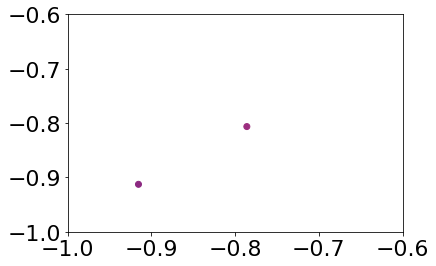

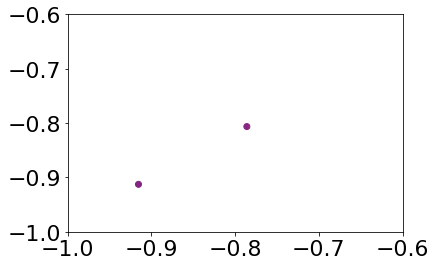

In [18]:
## Zoom in the lower left corner of thrid EF to better understand transition state


x = df['inter_all']
y = df['inter_cores']

color = df['5th_EF']

plt.scatter(x, y, c=color, cmap='magma')
plt.xlim(-1, -.6)
plt.ylim(-1, -.6)

plt.show()

x = df['inter_all']
y = df['inter_cores']

color = df['3rd_KT']

plt.scatter(x, y, c=color, cmap='magma')
plt.xlim(-1, -.6)
plt.ylim(-1, -.6)

plt.show()


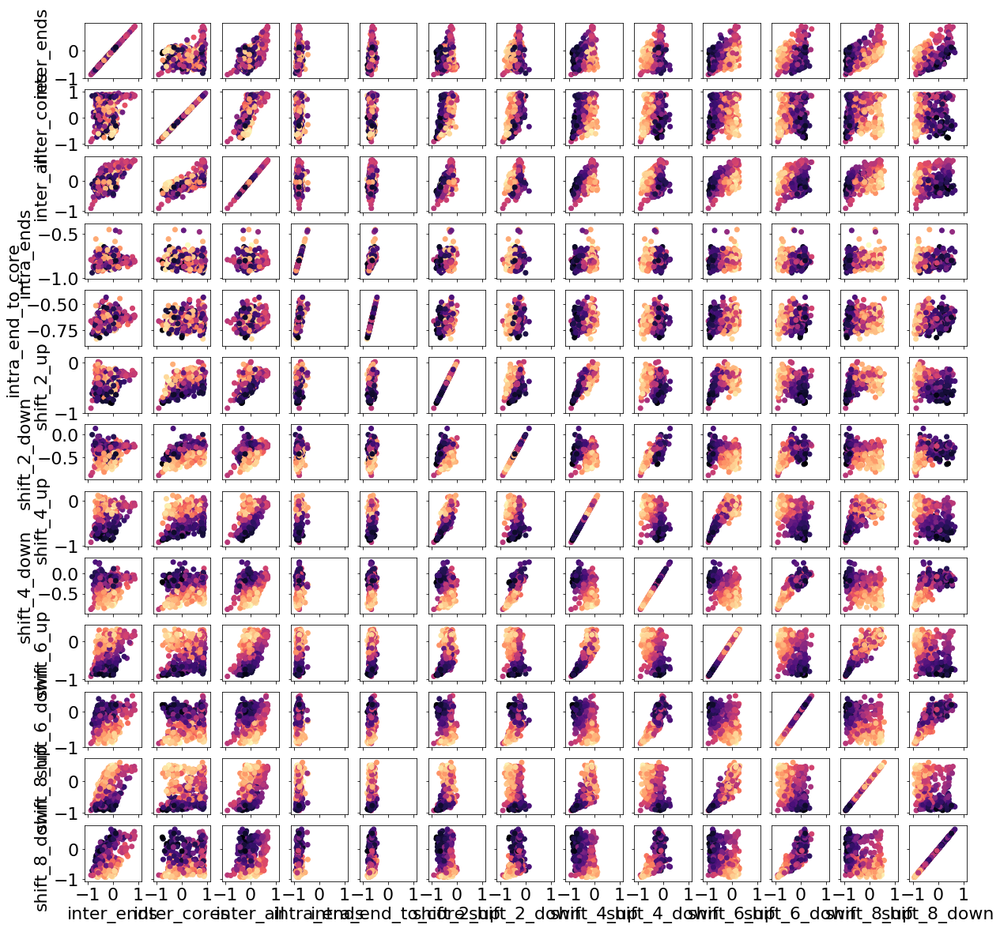

In [19]:
plot_subs(df, bp_match_dict, '1st_EF')

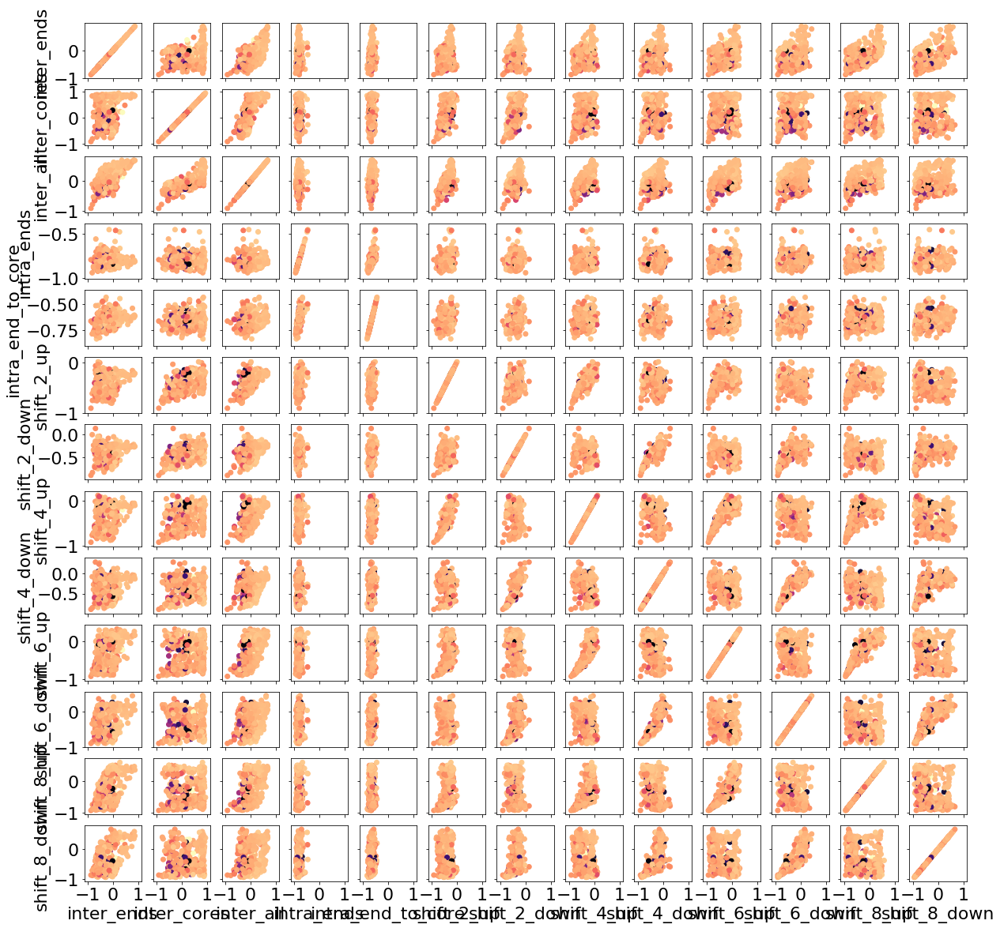

In [20]:
plot_subs(df, bp_match_dict, '2nd_EF')

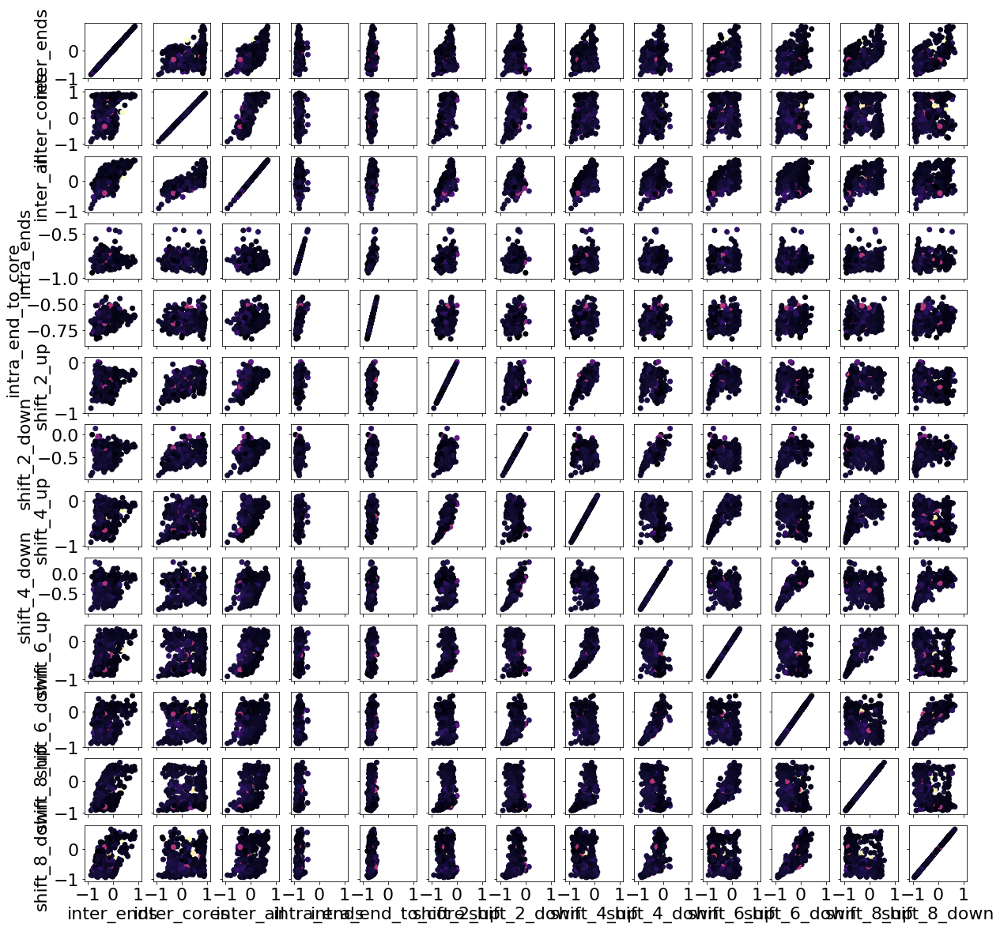

In [21]:
plot_subs(df, bp_match_dict, '3rd_EF')

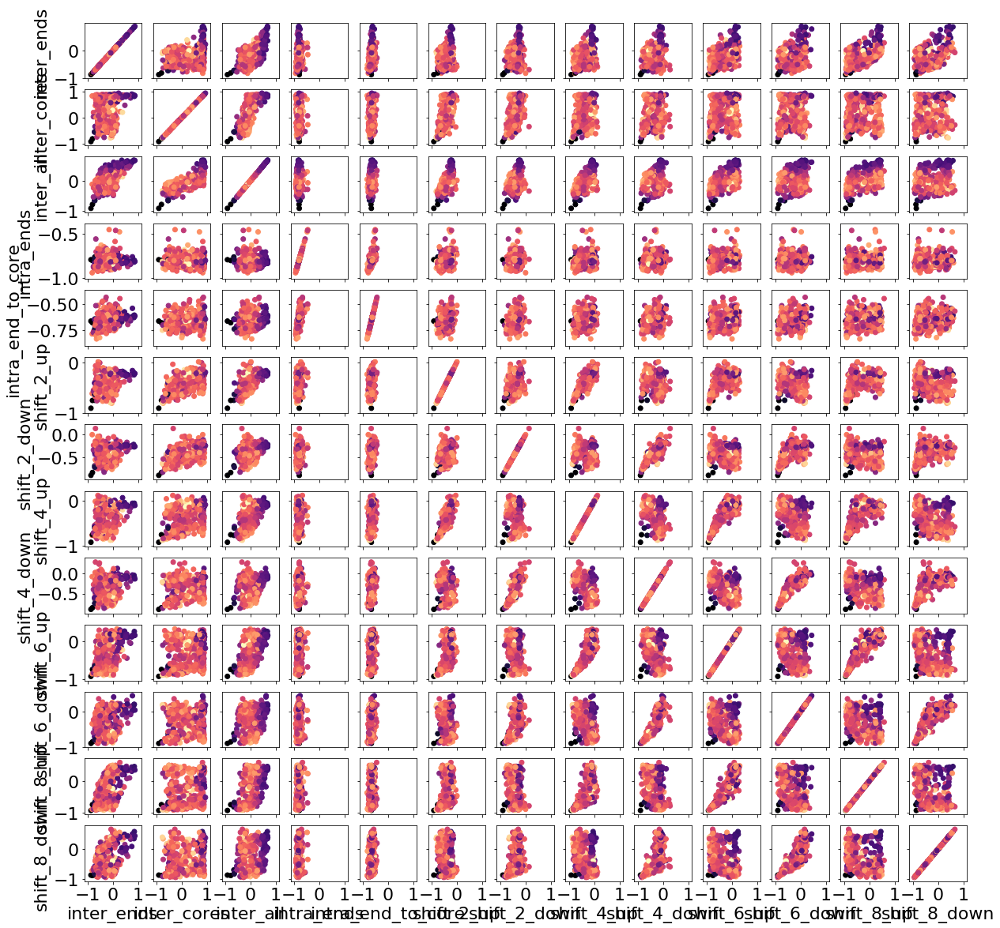

In [22]:
plot_subs(df, bp_match_dict, '4th_EF')

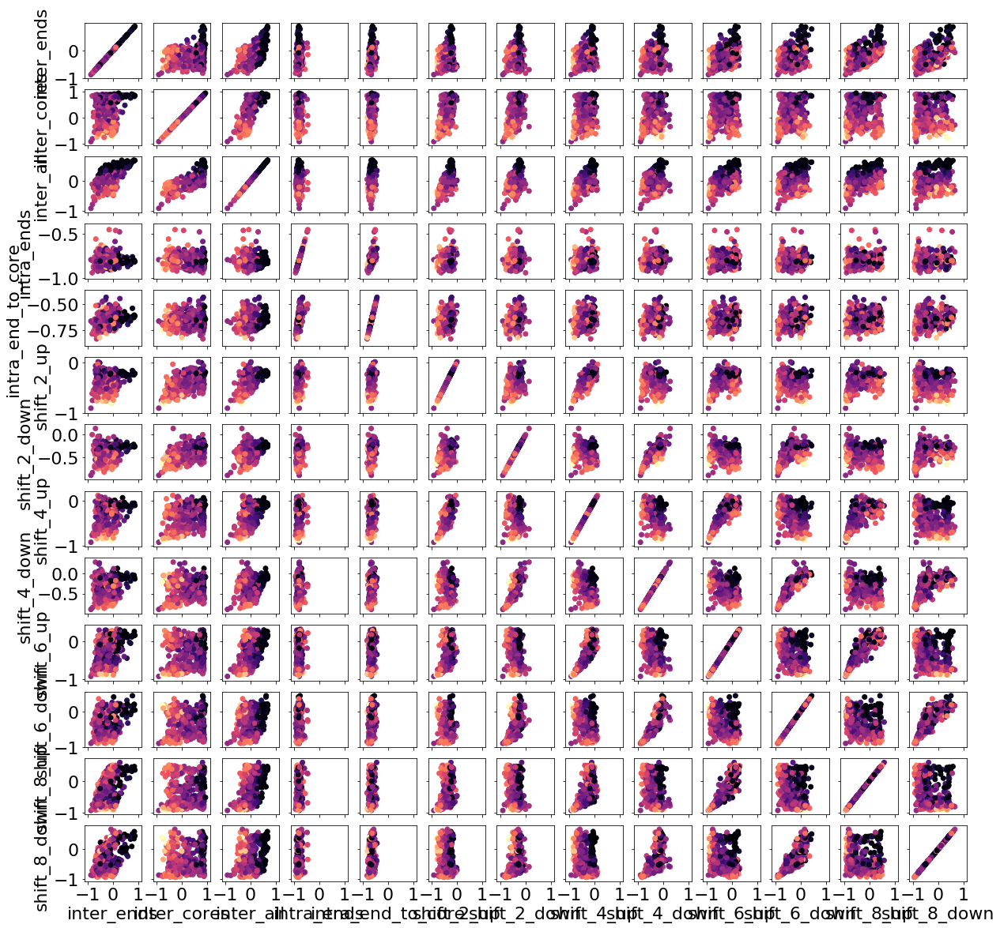

In [23]:
plot_subs(df, bp_match_dict, '5th_EF')

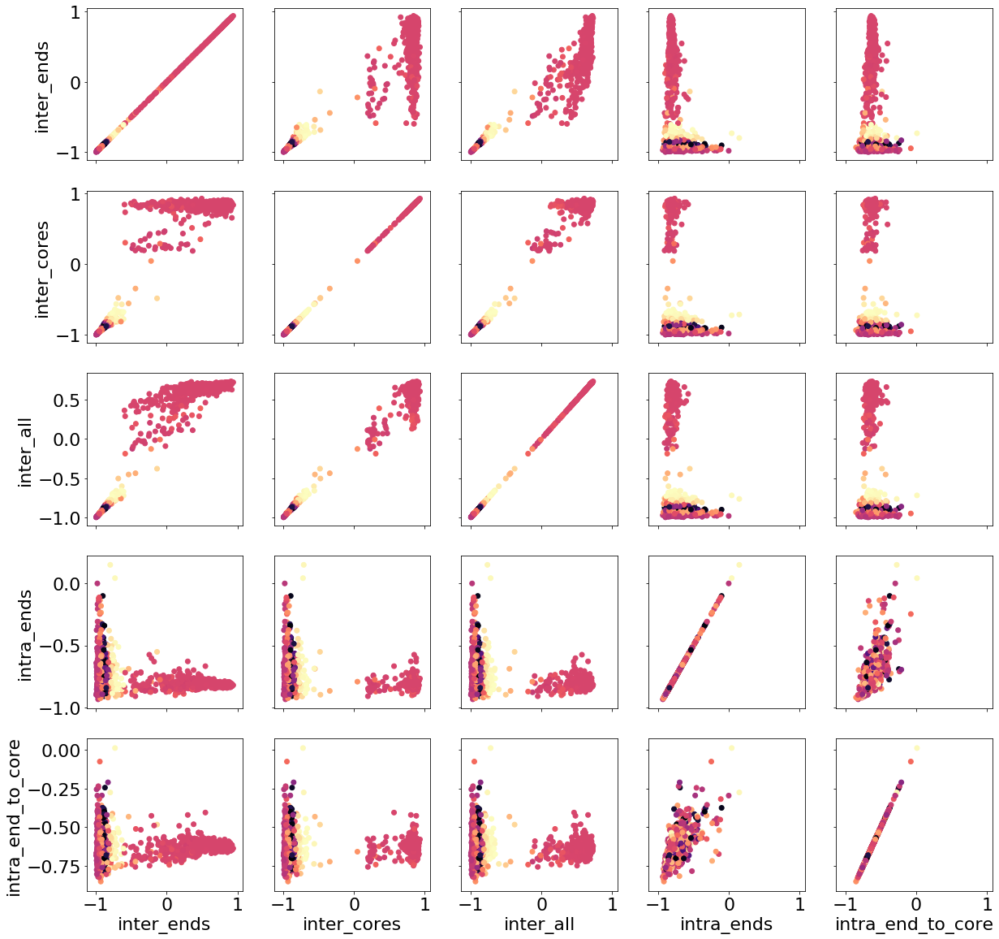

In [50]:
plot_subs(df, bp_match_dict, '6th_EF')

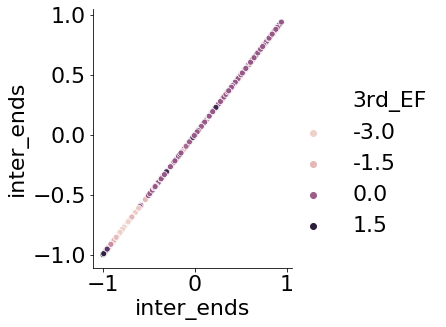

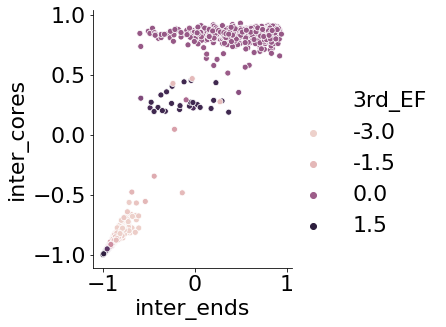

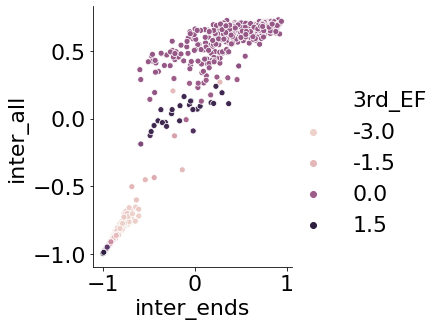

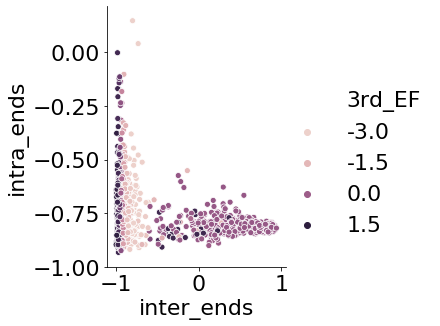

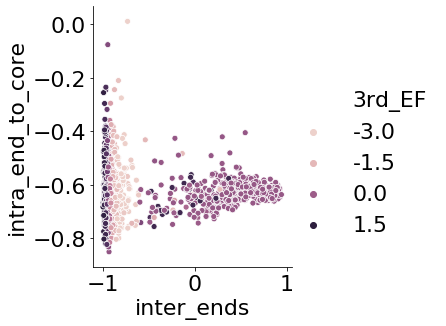

...

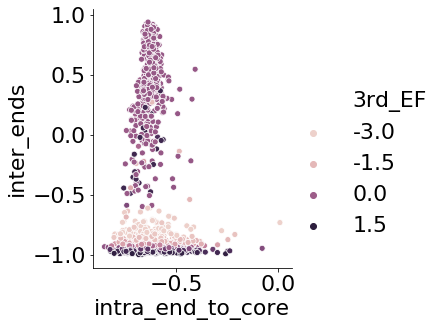

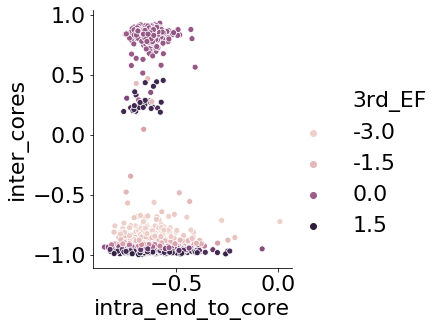

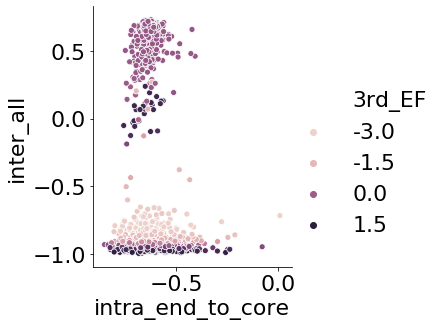

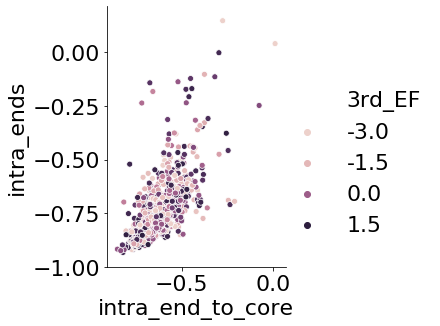

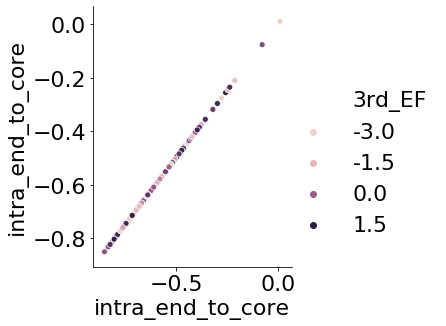

In [51]:
for k_i in bp_match_dict:
    for k_j in bp_match_dict:
        
        sns.relplot(data = df,
                    x = k_i, 
                    y = k_j, 
                    hue = "3rd_EF",
                    )